In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
print(tf.__version__)

2.11.0


In [2]:
if tf.test.gpu_device_name(): 

    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))

else:

   print("Please install GPU version of TF")

Please install GPU version of TF


In [3]:
(x_train,y_train),(x_test,y_test)=tf.keras.datasets.mnist.load_data()
#(x_train,y_train),(x_test,y_test)=tf.keras.datasets.fashion_mnist.load_data()
#(x_train1,y_train1),(x_test1,y_test1)=tf.keras.datasets.fashion_mnist.load_data()

In [4]:
x_train=x_train.astype("float32")/255
x_test=x_test.astype("float32")/255

In [5]:
print(x_test.shape)

(10000, 28, 28)


In [6]:
#Print samples per class
import collections
elements_count = collections.Counter(y_train)
#y_train.value_counts()
for key, value in elements_count.items():
    print(f"{key}: {value}")

5: 5421
0: 5923
4: 5842
1: 6742
9: 5949
2: 5958
3: 6131
6: 5918
7: 6265
8: 5851


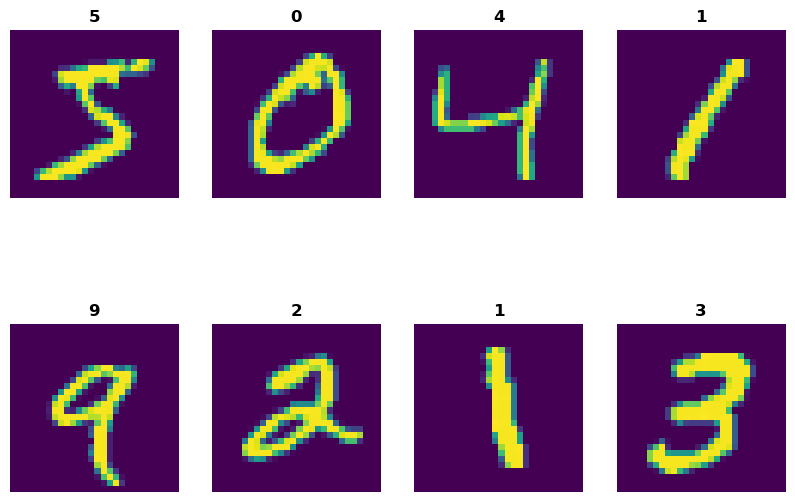

In [7]:
#print few sample images
# create figure
fig = plt.figure(figsize=(10, 7))
rows = 2
columns = 4
# Adds a subplot at the 2nd position

for i in range(8):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(x_train[i])
    plt.axis('off')
    plt.title(y_train[i])

In [8]:
print("Train:{}".format(x_train.shape))
print("Test:{}".format(x_test.shape))

Train:(60000, 28, 28)
Test:(10000, 28, 28)


In [9]:
#Chnage the dimension to compactible with tensor flow models
x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)

In [10]:
print("Train:{}".format(x_train.shape))
print("Test:{}".format(x_test.shape))

Train:(60000, 28, 28, 1)
Test:(10000, 28, 28, 1)


In [11]:
NUM_CLASSES = len(np.unique(np.concatenate((y_train, y_test)))) # might as well set it as 10 since we know the dataset
NUM_CLASSES

10

In [12]:
IMG_SIZE = x_train[0].shape[0]

In [13]:
#Encode Labels
y_train=tf.keras.utils.to_categorical(y_train,NUM_CLASSES)
y_test=tf.keras.utils.to_categorical(y_test,NUM_CLASSES)

In [14]:
print("Train Label:{}".format(y_train.shape))
print("Test Label:{}".format(y_test.shape))

Train Label:(60000, 10)
Test Label:(10000, 10)


## MODEL 1

In [15]:
model1=tf.keras.Sequential(
[
    tf.keras.Input(shape=(IMG_SIZE,IMG_SIZE,1)),
    tf.keras.layers.Conv2D(32,kernel_size=(3,3),activation='relu',name='C1'),
    tf.keras.layers.Conv2D(16,kernel_size=(3,3),activation='relu',name='C2'),
    tf.keras.layers.Conv2D(16,kernel_size=(3,3),activation='relu',name='C3'),
    tf.keras.layers.Conv2D(8, kernel_size=(3, 3), activation="relu",name='C4'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(NUM_CLASSES, activation="softmax"),
    ]
)
            

In [16]:
model1.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [17]:

model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 C1 (Conv2D)                 (None, 26, 26, 32)        320       
                                                                 
 C2 (Conv2D)                 (None, 24, 24, 16)        4624      
                                                                 
 C3 (Conv2D)                 (None, 22, 22, 16)        2320      
                                                                 
 C4 (Conv2D)                 (None, 20, 20, 8)         1160      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 10, 10, 8)        0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                        

In [ ]:
BATCH_SIZE=128
EPOCHS= 5 #1,5,10,15,25
history = model1.fit(x_train, y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.1)

Epoch 1/5
422/422 [==============================] - 48s 112ms/step - loss: 0.4231 - accuracy: 0.8613 - val_loss: 0.0933 - val_accuracy: 0.9737
Epoch 2/5
323/422 [=====================>........] - ETA: 11s - loss: 0.1458 - accuracy: 0.9545

In [159]:
#Iterate thru all the layers of the model
for layer in model1.layers:
    if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        #print(layer.name, filters.shape)
        
        #normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)  
        print(filters.shape[3])
        filter_cnt=1

In [160]:
score = model1.evaluate(x_test, y_test, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Test loss: 0.24491015076637268
Test accuracy: 0.9138000011444092


## Feature Maps


In [161]:
def build_featuremap_model(model):
    conv_layer_outputs = [layer.output for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]
    new_model = tf.keras.models.Model(inputs = model.inputs, outputs=conv_layer_outputs)
    new_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
    return new_model

In [162]:
new_global_model = build_featuremap_model(model1)

In [163]:
outs = new_global_model(x_test[:20])

In [164]:
conv_outs = outs

In [165]:
def get_feature_maps_from_outs(outs):# layers x imgs x h x w x filters
    num_layers = len(outs)
    num_imgs = outs[0].shape[0]
    img_outs = [[[] for _ in range(num_layers)] for _ in range(num_imgs)]
    for i in range(num_layers):
        for j in range(num_imgs):
            img_out = outs[i][j]
            for k in range(img_out.shape[-1]):
                img_outs[j][i].append(img_out[:, :, k])
                
    return img_outs # imgs x layers x filters x h x w

In [166]:
img_outs = get_feature_maps_from_outs(conv_outs)

In [167]:
def softmax_image(image):
    orig_shape = image.shape
    return tf.reshape(tf.math.softmax(tf.reshape(image, [-1])), orig_shape)

In [168]:
def show_conv_features(j, outs):
    num_imgs_per_row = 8
    num_imgs = 16 * (2**j)
    nrows = num_imgs//num_imgs_per_row
    ncols = num_imgs_per_row
    img_size = 10
    fig, ax = plt.subplots(nrows, ncols, figsize=(img_size*ncols, img_size*nrows))
    all_filters = outs[0][j]
    print(len(all_filters))
    for i, f_map in enumerate(all_filters):
        ax[i//num_imgs_per_row, i%num_imgs_per_row].imshow(f_map, aspect="auto", cmap="jet")

In [169]:
@tf.function
def normalize(heatmap):
    num = heatmap - tf.reduce_min(heatmap)
    deno = (tf.reduce_max(heatmap) - tf.reduce_min(heatmap))
    if deno == 0:
        return heatmap
    heatmap = num / deno
    return heatmap

In [170]:
soft_img_outs = [[[softmax_image(filter_out) for filter_out in layer_out] for layer_out in img_out] for img_out in img_outs]

In [171]:
layer_names = [layer.name for layer in model1.layers if isinstance(layer, tf.keras.layers.Conv2D)]
layer_names

['C1', 'C2', 'C3', 'C4']

C:\Users\sikha\anaconda3\envs\gpu2\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


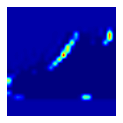

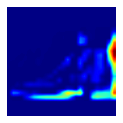

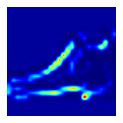

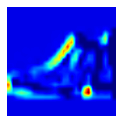

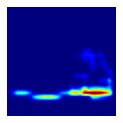

...

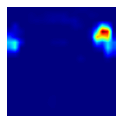

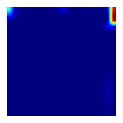

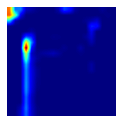

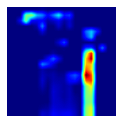

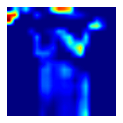

In [172]:
for img_id, img_out in enumerate(soft_img_outs):
    !mkdir "D:/RESEARCH/POST_PHD/UPC/000_DMD_DL/0000_Paper_Drafr/Results/FASHION_MNIST_Model1/epoch35_91.5/$img_id/"
    for layer_id, layer_out in enumerate(img_out):
        for filter_id, filter_out in enumerate(layer_out):
            img = filter_out
            img = tf.image.resize(img[tf.newaxis, ..., tf.newaxis], [128, 128])
            img = tf.squeeze(img)
            plt.figure(figsize=(2,2))
            plt.imshow( img, cmap="jet")
            plt.axis('off')
            plt.savefig(f"D:/RESEARCH/POST_PHD/UPC/000_DMD_DL/0000_Paper_Drafr/Results/FASHION_MNIST_Model1/epoch35_91.5/{img_id}/layer-{layer_id}-{layer_names[layer_id]}-{filter_id}.png",bbox_inches='tight', pad_inches=0)
            #plt.imsave(f"maps/softmax_output/{img_id}/layer-{layer_id}-{layer_names[layer_id]}-{filter_id}.jpg", img)

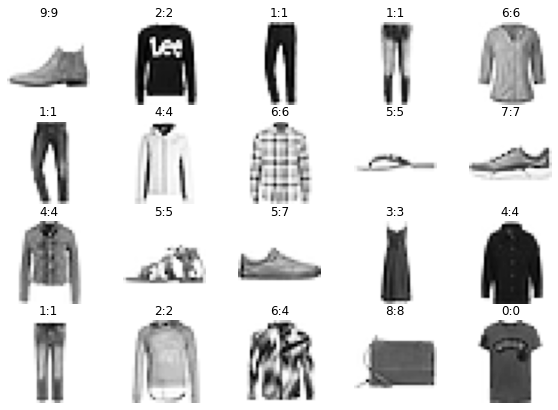

In [173]:
fig = plt.figure(figsize=(10, 7))
for i in range(1,21):
    fig.add_subplot(4, 5, i)
    image_index = i-1
    plt.imshow(x_test[image_index].reshape(28, 28),cmap='Greys')
    pred = model1.predict(x_test[image_index].reshape(1, 28, 28, 1))
    plt.title("{}:{}".format(pred.argmax(),y_test1[i-1]))
    plt.axis('off')
    #print(pred.argmax())

In [157]:
model1.save('D:/RESEARCH/POST_PHD/UPC/000_DMD_DL/0000_Paper_Drafr/Results/FASHION_MNIST_Model1/epoch35_91.5.h5')